In [ ]:
# %%

import pickle
from pathlib import Path
from importlib import reload
from dipy.reconst.shm import sf_to_sh, sh_to_sf
from dipy.core.sphere import Sphere
import numpy as np
import torch
import torch.nn as nn
from tqdm import tqdm
from matplotlib import pyplot as plt
try:
    import vmf_convolution
except ImportError:
    import vmf_convolution
reload(vmf_convolution)
import plots
from torch_geometric import nn as gnn
from scipy.special import softmax
import os
import hcp_utils as hcp
import torch_harmonics
import nilearn.plotting as plotting

DIR = r'C:\Github\data_science\INRIA-multivariate_regression\codes\sfno\figures'

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print (DEVICE)

def compute_new_angles_grid(nlat, nlon):
    new_phi = np.linspace(0, 2 * np.pi, nlon + 1)[1:]
    new_theta = np.linspace(0, np.pi, nlat)
    new_phi, new_theta = np.meshgrid(new_phi, new_theta)

    return new_theta, new_phi

# Data and vertices representation

file_path = os.path.join(r'C:\Github\pavi_data', '12_mean_sample_post.pt')
sample = torch.load(file_path, map_location=DEVICE)

temperature = 1
data = softmax(sample['theta_s'].detach().cpu() / temperature, axis=-1)

vertices = hcp.mesh['sphere'][0] / np.linalg.norm(hcp.mesh['sphere'][0], axis=1, keepdims=True)
mask = hcp.cortex_data(np.ones(len(vertices))).astype(bool)

print(f"{hcp.mesh['sphere'][0].shape=}")

cuda
hcp.mesh['sphere'][0].shape=(64984, 3)


In [ ]:
#%%

vertices_left  = vertices[:32492]
vertices_right = vertices[32492:]

print (f"{vertices_left.shape=}, {vertices_right.shape=}")

vertices_left.shape=(32492, 3), vertices_right.shape=(32492, 3)


In [ ]:
#%% Representation of the network for one subject before transformation

sj_1 = data[0, :, 0]

fig_1 = plotting.view_surf(hcp.mesh.inflated, hcp.cortex_data(sj_1, fill=0), symmetric_cmap=False, cmap='Oranges',
    threshold=0.001)

file_name = "cortex_original.html"
fig_1.save_as_html(os.path.join(DIR,file_name))
plt.close()

In [ ]:
#%%

data_cortex = np.zeros((data.shape[0], len(mask), data.shape[-1]))
data_cortex[:, mask, :] = data


print (f"{data_cortex.shape=}")

data_cortex.shape=(240, 64984, 17)


In [ ]:
#%%

# Interpolation to a grid
sh_order = 80
nlat = int(np.sqrt(len(vertices_left)/2))
nlon = 2 * nlat
sphere_src = Sphere(xyz=vertices_left)
mesh_theta, mesh_phi = compute_new_angles_grid(nlat, nlon)
sphere_dst = Sphere(theta=mesh_theta.ravel(), phi=mesh_phi.ravel())

network_left.shape=(240, 32492), network_right.shape=(240, 32492)
new_data_right.shape=(240, 127, 254)
new_data_left.shape =(240, 127, 254)


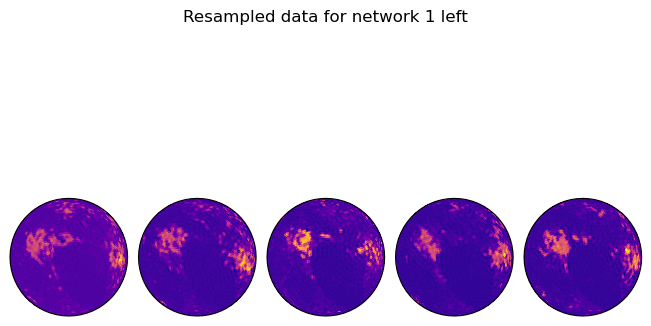

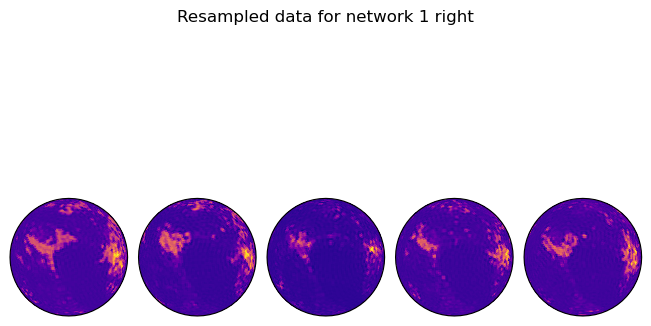

In [ ]:
#%%

#TEST FOR NETWORK NUMBER 1:
net_number = 0

network_left = data_cortex[:, :len(vertices_left), net_number]
network_right= data_cortex[:, len(vertices_right):, net_number]
print (f"{network_left.shape=}, {network_right.shape=}")

sh = sf_to_sh(network_left, sphere_src, sh_order_max=sh_order)
new_data_left = sh_to_sf(sh, sphere_dst, sh_order_max=sh_order)
sh_2 = sf_to_sh(new_data_left, sphere_dst, sh_order_max=sh_order)
new_data_original_space_left = sh_to_sf(sh_2, sphere_src, sh_order_max=sh_order)

sh = sf_to_sh(network_right, sphere_src, sh_order_max=sh_order)
new_data_right = sh_to_sf(sh, sphere_dst, sh_order_max=sh_order)
sh_2 = sf_to_sh(new_data_right, sphere_dst, sh_order_max=sh_order)
new_data_original_space_right = sh_to_sf(sh_2, sphere_src, sh_order_max=sh_order)

new_data_left = new_data_left.reshape(-1, *mesh_theta.shape)
new_data_right = new_data_right.reshape(-1, *mesh_theta.shape)
print (f"{new_data_right.shape=}")
print (f"{new_data_left.shape =}")


fig = plt.figure(layout='constrained')
fig.suptitle("Resampled data for network " + str(net_number+1) + " left")
subfigs = fig.subfigures(1, 5).ravel()

for i, subfig in enumerate(subfigs):
    plots.plot_sphere(new_data_left[i], fig=subfig, cmap='plasma')

fig = plt.figure(layout='constrained')
fig.suptitle("Resampled data for network " + str(net_number+1) + " right")
subfigs = fig.subfigures(1, 5).ravel()

for i, subfig in enumerate(subfigs):
   plots.plot_sphere(new_data_right[i], fig=subfig, cmap='plasma')

In [ ]:
#%%

print(new_data_original_space_left.shape)
print(new_data_left.shape)
print(new_data_right.shape)

(240, 32492)
(240, 127, 254)
(240, 127, 254)


In [ ]:
#%%

fig_2 = plotting.view_surf(hcp.mesh.inflated, np.hstack([new_data_original_space_left[0],new_data_original_space_right[0]]).clip(0, 1), symmetric_cmap=False, cmap='Oranges',
    threshold=0.001)

file_name = "c_four=" + str(sh_order)+ "_net=1.html"
fig_2.save_as_html(os.path.join(DIR,file_name))
plt.close()

c:\Users\joaqu\anaconda3\envs\data_science\Lib\site-packages\torch\functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ..\aten\src\ATen\native\TensorShape.cpp:3588.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Iteration 0, Loss: 0.0016873606946319342
Iteration 50, Loss: 0.0016727736219763756
Iteration 100, Loss: 0.0016706916503608227
Iteration 150, Loss: 0.0016688717296347022
Iteration 200, Loss: 0.001667211065068841
Iteration 250, Loss: 0.0016656736843287945
Iteration 300, Loss: 0.0016642357222735882
Iteration 350, Loss: 0.0016628780867904425
Iteration 400, Loss: 0.0016615872737020254
Iteration 450, Loss: 0.0016603523399680853
Iteration 500, Loss: 0.0016591651365160942
Iteration 550, Loss: 0.0016580187948420644
Iteration 600, Loss: 0.0016569086583331227
Iteration 650, Loss: 0.0016558293718844652
Iteration 700, Loss: 0.0016547779086977243
Iteration 750, Loss: 0.0016537513583898544
Iteration 800, Loss: 0.0016527464613318443
Iteration 850, Loss: 0.0016517618205398321
Iteration 900, Loss: 0.0016507948748767376
Iteration 950, Loss: 0.0016498446930199862
Iteration 1000, Loss: 0.0016489095287397504


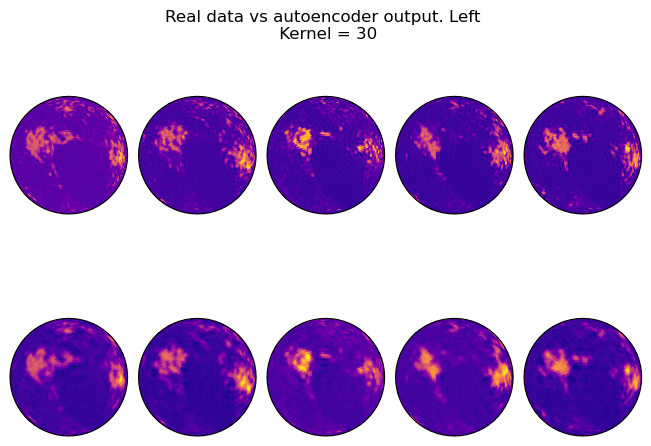

<Figure size 640x480 with 0 Axes>

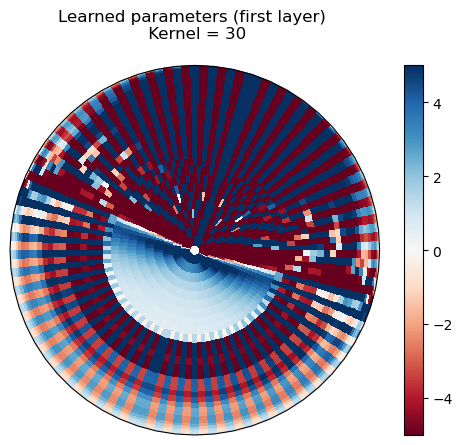

<Figure size 640x480 with 0 Axes>

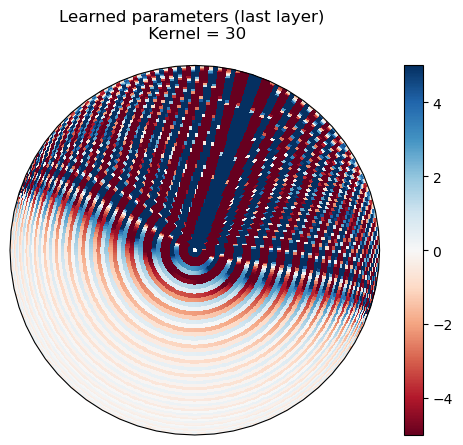

In [ ]:
#%%

# Autoencoder architecture which reduces dimensionality to half

kernel = 30
vmfconvolution_learnable_left = gnn.Sequential(
    'x0',
    [
        (vmf_convolution.VMFConvolution(kernel, nlat, nlon, output_ratio=.5, weights=False, bias=True), 'x0->x1'),
        (vmf_convolution.VMFConvolution(kernel, nlat, nlon, input_ratio=.5, output_ratio=.25, weights=False, bias=True), 'x1->x2'),
        (vmf_convolution.VMFConvolution(kernel, nlat, nlon, input_ratio=.25, output_ratio=.5, weights=False, bias=True), 'x2->x3 '),
        (vmf_convolution.VMFConvolution(kernel, nlat, nlon, input_ratio=.5, weights=False, bias=True), 'x3 + x1->x4')
    ]
).to(DEVICE)

vmfconvolution_learnable_right = gnn.Sequential(
    'x0',
    [
        (vmf_convolution.VMFConvolution(kernel, nlat, nlon, output_ratio=.5, weights=False, bias=True), 'x0->x1'),
        (vmf_convolution.VMFConvolution(kernel, nlat, nlon, input_ratio=.5, output_ratio=.25, weights=False, bias=True), 'x1->x2'),
        (vmf_convolution.VMFConvolution(kernel, nlat, nlon, input_ratio=.25, output_ratio=.5, weights=False, bias=True), 'x2->x3 '),
        (vmf_convolution.VMFConvolution(kernel, nlat, nlon, input_ratio=.5, weights=False, bias=True), 'x3 + x1->x4')
    ]
).to(DEVICE)

# Autoencoder training
# Initialize close to identity
for step in vmfconvolution_learnable_left:
    nn.init.ones_(step.bias)

# Initialize close to identity
for step in vmfconvolution_learnable_right:
    nn.init.ones_(step.bias)

lr = 1.
optim_left = torch.optim.SGD(vmfconvolution_learnable_left.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optim_left, 50, gamma=0.1)

new_data_tensor_left = torch.Tensor(np.exp(-new_data_left)).to(DEVICE)
new_data_tensor_left_normed = nn.functional.normalize(torch.exp(-new_data_tensor_left), dim=[-2, -1])

losses = []
for iter in range(1001):
    optim_left.zero_grad(set_to_none=True)

    # Forward pass
    prediction = nn.functional.normalize(vmfconvolution_learnable_left(new_data_tensor_left_normed), dim=[-2, -1])

    # Compute loss
    loss = ((prediction - new_data_tensor_left_normed) ** 2).sum(dim=[-2, -1]).mean()

    # Backward pass
    loss.backward()

    # Optimization step
    optim_left.step()

    # Append and print loss
    loss_value = loss.item()
    losses.append(loss_value)
    if (iter % 50 == 0):
            print(f"Iteration {iter}, Loss: {loss_value}")

with torch.no_grad():
    predicted_left = vmfconvolution_learnable_left(new_data_tensor_left_normed)

fig = plt.figure(layout='constrained')
subfigs = fig.subfigures(2, 5)
fig.suptitle(f"Real data vs autoencoder output. Left \n Kernel = " + str(kernel))

for i in range(min(subfigs.shape[1], predicted_left.shape[0])):
    plots.plot_sphere(new_data_tensor_left_normed[i].cpu().numpy(), cmap='plasma', fig=subfigs[0, i])
    plots.plot_sphere(predicted_left[i].cpu().numpy(), cmap='plasma', fig=subfigs[1, i])

# Print learned parameters
with torch.no_grad():
    x_ = vmfconvolution_learnable_left[0].kernel()
    x__ = vmfconvolution_learnable_left[-1].kernel()

plt.figure(layout='constrained')
plots.plot_sphere(x_.cpu(), colorbar=True, vmin=-5, vmax=5, central_latitude=90, title=f"Learned parameters (first layer) \n Kernel = " + str(kernel))
plt.figure(layout='constrained')
plots.plot_sphere(x__.cpu(), colorbar=True, vmin=-5, vmax=5, central_latitude=90, title=f"Learned parameters (last layer) \n Kernel = " + str(kernel))

Iteration 0, Loss: 0.001570117543451488
Iteration 50, Loss: 0.0015546591021120548
Iteration 100, Loss: 0.001552840112708509
Iteration 150, Loss: 0.0015513055259361863
Iteration 200, Loss: 0.001549893175251782
Iteration 250, Loss: 0.0015485775656998158
Iteration 300, Loss: 0.0015473392559215426
Iteration 350, Loss: 0.0015461646253243089
Iteration 400, Loss: 0.00154504319652915
Iteration 450, Loss: 0.00154396565631032
Iteration 500, Loss: 0.0015429261839017272
Iteration 550, Loss: 0.0015419189585372806
Iteration 600, Loss: 0.0015409397892653942
Iteration 650, Loss: 0.0015399856492877007
Iteration 700, Loss: 0.0015390528133139014
Iteration 750, Loss: 0.001538139651529491
Iteration 800, Loss: 0.0015372440684586763
Iteration 850, Loss: 0.0015363639686256647
Iteration 900, Loss: 0.0015354981878772378
Iteration 950, Loss: 0.00153464509639889
Iteration 1000, Loss: 0.0015338044613599777


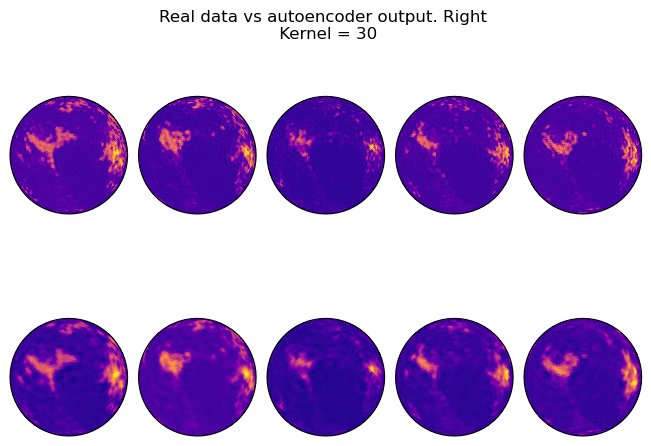

<Figure size 640x480 with 0 Axes>

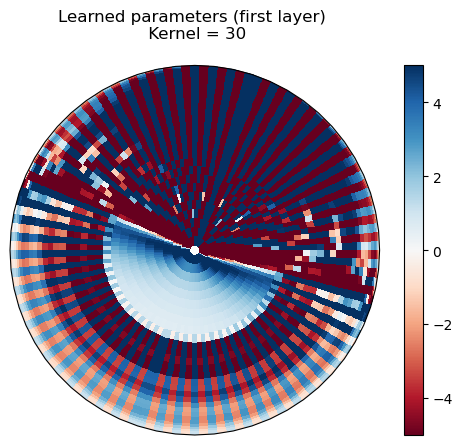

<Figure size 640x480 with 0 Axes>

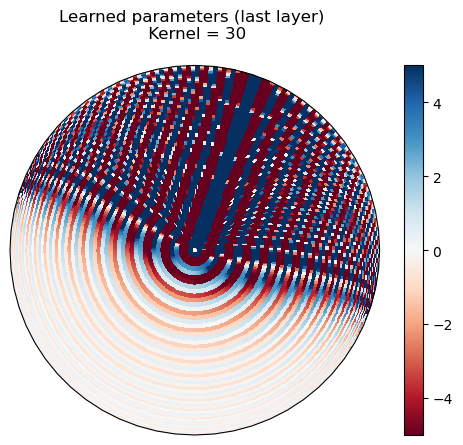

In [ ]:
# %%

lr = 1.
optim_right = torch.optim.SGD(vmfconvolution_learnable_right.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optim_right, 50, gamma=0.1)

new_data_tensor_right = torch.Tensor(np.exp(-new_data_right)).to(DEVICE)
new_data_tensor_right_normed = nn.functional.normalize(torch.exp(-new_data_tensor_right), dim=[-2, -1])

losses = []
for iter in range(1001):
    optim_right.zero_grad(set_to_none=True)

    # Forward pass
    prediction = nn.functional.normalize(vmfconvolution_learnable_right(new_data_tensor_right_normed), dim=[-2, -1])

    # Compute loss
    loss = ((prediction - new_data_tensor_right_normed) ** 2).sum(dim=[-2, -1]).mean()

    # Backward pass
    loss.backward()

    # Optimization step
    optim_right.step()

    # Append and print loss
    loss_value = loss.item()
    losses.append(loss_value)
    if (iter % 50 == 0):
            print(f"Iteration {iter}, Loss: {loss_value}")

with torch.no_grad():
    predicted_right = vmfconvolution_learnable_right(new_data_tensor_right_normed)

fig = plt.figure(layout='constrained')
subfigs = fig.subfigures(2, 5)
fig.suptitle(f"Real data vs autoencoder output. Right \n Kernel = " + str(kernel))

for i in range(min(subfigs.shape[1], predicted_right.shape[0])):
    plots.plot_sphere(new_data_tensor_right_normed[i].cpu().numpy(), cmap='plasma', fig=subfigs[0, i])
    plots.plot_sphere(predicted_right[i].cpu().numpy(), cmap='plasma', fig=subfigs[1, i])

# Print learned parameters
with torch.no_grad():
    x_ = vmfconvolution_learnable_right[0].kernel()
    x__ = vmfconvolution_learnable_right[-1].kernel()

plt.figure(layout='constrained')
plots.plot_sphere(x_.cpu(), colorbar=True, vmin=-5, vmax=5, central_latitude=90, title=f"Learned parameters (first layer) \n Kernel = " + str(kernel))
plt.figure(layout='constrained')
plots.plot_sphere(x__.cpu(), colorbar=True, vmin=-5, vmax=5, central_latitude=90, title=f"Learned parameters (last layer) \n Kernel = " + str(kernel))

In [ ]:
#%% Reconstructed after convolution

predicted_reshaped_left = predicted_left.reshape(predicted_left.shape[0], np.prod(predicted_left.shape[1:]))
print ("Autoencoder output left reshaped to:")
print (predicted_reshaped_left.shape)

sh_inverse = sf_to_sh(predicted_reshaped_left.cpu(), sphere_dst, sh_order_max=20)
print(sh_inverse.shape)

new_data_inverse_left = sh_to_sf(sh_inverse, sphere_src, sh_order_max=20)
print (new_data_inverse_left.shape)


predicted_reshaped_right = predicted_right.reshape(predicted_right.shape[0], np.prod(predicted_right.shape[1:]))
print ("Autoencoder output right reshaped to:")
print (predicted_reshaped_right.shape)

sh_inverse = sf_to_sh(predicted_reshaped_right.cpu(), sphere_dst, sh_order_max=20)
print(sh_inverse.shape)

new_data_inverse_right = sh_to_sf(sh_inverse, sphere_src, sh_order_max=20)
print (new_data_inverse_right.shape)

Autoencoder output left reshaped to:
torch.Size([240, 32258])
(240, 231)
(240, 32492)
Autoencoder output right reshaped to:
torch.Size([240, 32258])
(240, 231)
(240, 32492)


In [ ]:
# %%

# Plotting the inverse

nd_inverse_one_subject_left = new_data_inverse_left[0,:]
nd_inverse_one_subject_right = new_data_inverse_right[0,:]


print (nd_inverse_one_subject_left.shape)
print (nd_inverse_one_subject_right.shape)

(32492,)
(32492,)


In [ ]:
# %%

fig_3 = plotting.view_surf(hcp.mesh.inflated, np.hstack([nd_inverse_one_subject_left, nd_inverse_one_subject_right]).clip(0, 1), symmetric_cmap=False, cmap='Oranges',
    threshold=0.001)

file_name = "autoenc_output.html"
fig_3.save_as_html(os.path.join(DIR,file_name))
plt.close()

In [ ]:
# %%

fig_1

In [ ]:
# %%

fig_2

In [ ]:
# %%

fig_3